# Проект "Рынок заведений общественного питания Москвы"

Презентация: https://drive.google.com/file/d/1YmzVrldqFl4lXLVhro7igLNP-HNke68M/view?usp=sharing

#  [Введение](#back)
<a id='start'></a>

## Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят нас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## План работы

- Шаг 1. Загрузим данные и изучим общую информацию.
- Шаг 2. Выполним предобработку данных. Создадим столбец street с названиями улиц из столбца с адресом. Создаим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно.
- Шаг 3. Анализ данных. К каждому пункту построим график, лучше всего визуализирующий задание и напишем вывод:
 - Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
 - Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
 - Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. 
 - Узнаем, какие категории заведений чаще являются сетевыми.
 - Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Отобразим общее количество заведений и количество заведений каждой категории по районам.
 - КУхнаем, акие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. 
 - Визуализируем распределение средних рейтингов по категориям заведений.
 - Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
 - Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
 - Найдем топ-15 улиц по количеству заведений. 
 - Найдем улицы, на которых находится только один объект общепита. 
 - Необязательное задание: проиллюстрируем другие взаимосвязи, которые мы найдем в данных. 
 - Соберем наблюдения по вопросам выше в один общий вывод.
- Шаг 4. Детализируем исследование: открытие кофейни
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.
Ответим на следующие вопросы:
 - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
 - Есть ли круглосуточные кофейни?
 - Какие у кофеен рейтинги? Как они распределяются по районам?
 - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
 - По желанию мы можем расширить список вопросов для исследования, добавив собственные.
 - Построим визуализации. Попробуем дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но решение должно быть чем-то обосновано. Объясним свою рекомендацию например текстом с описанием или маркерами на географической карте.
- Шаг 5. Подготовим презентацию проекта


#   [Оглавление](#back)
<a id='back'></a>
- [Введение](#start)
- [Предобработка данных](#info)
- [Изучение и анализ данных](#analitics)
- [Открытие кофейни](#cofee)

#  [Предобработка данных](#back)
<a id='info'></a>


In [1]:
#импортируем необхоимые библиотеки
import pandas as pd 
pd.options.mode.chained_assignment = None
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import math as mth
from scipy import stats as st
import numpy as np


import plotly.express as px
import plotly.graph_objects as go

#cразу сделаем графики чуть больше и красивееи
from pylab import rcParams
rcParams['figure.figsize'] = 15, 7 
sns.set_style("darkgrid")

In [2]:
#!pip install folium 
#установим folium

Подключим геолокацию:

In [3]:
# подключаем библиотеку
import folium

# подключаем модуль для работы с JSON-форматом
import json
# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r', encoding='utf8') as f:
    geo_json = json.load(f)
# импортируем карту и хороплет
from folium import Map, Choropleth

In [4]:
#сохраним данные
df = pd.read_csv('moscow_places.csv')

Оценим данные:

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В целом - данные в порядке

In [6]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Видно множество пропусков, возможно стоит поработать с нзваниями

Для нахождения дубликатов, приведем значения в нижний регистр:

In [7]:
df['name'] = df['name'].str.lower()
df['category'] = df['category'].str.lower()
#df['district'] = df['district'].str.lower()
df['address'] = df['address'].str.lower()
df['price'] = df['price'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()

Названия округов оставим как есть для избежания конфликта с геолокацией.

#### Cтолбцы 'name', 'category', 'address, 'district', 'chain':

Оценим уникальные названия:

In [8]:
df['name'].unique()

array(['wowфли', 'четыре комнаты', 'хазри', ..., 'миславнес', 'самовар',
       'kebab time'], dtype=object)

Оценим уникальные адреса:

In [9]:
df['address'].unique()

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15', ...,
       'москва, улица лобачевского, 52, корп. 1',
       'москва, болотниковская улица, 52, корп. 2',
       'москва, чонгарский бульвар, 26а, корп. 1'], dtype=object)

И категории:

In [10]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Учитывая обилие спец.символов, возможности встретить буквы "ё" и "е", будет разумно сразу избавиться от проблем с ними:

  Избавимся от "ё" в названиях и адресах:

In [11]:
df['name'] = df['name'].str.replace('ё','е')
df['address'] = df['address'].str.replace('ё','е')

Заменим лишние символы в названиях на пробелы в названиях:

In [12]:
symbol_list = [',', '(', ')', '«', '»', '"', '  ', '_', '-']
for symbol in symbol_list:
    df['name'] = df['name'].str.replace(symbol, ' ')

C:\Users\TigrUno\AppData\Local\Temp\ipykernel_8804\2855850960.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['name'] = df['name'].str.replace(symbol, ' ')


Оценим уникальные названия категорий:

In [13]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Данные в порядке, но не хватает данных об округах вне МКАДа: Зеленограде, Новой Москве и пр. Оценим число дубликатов:

In [14]:
df.duplicated().sum()

0

Полных дубликатов нету, посмотрим на совпадения названия и адреса:

In [15]:
df.duplicated(subset=['name', 'address']).sum()

4

In [16]:
df[df.duplicated(subset=['name', 'address'])].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [17]:
df[df['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"москва, духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [18]:
df[df['name'] == 'раковарня клешни и хвосты']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","москва, братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


In [19]:
df[df['name'] == 'хлеб да выпечка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"москва, каширское шоссе, 61г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


Если кафе с названием "кафе" - по одному и тому же адресу могут быть разными заведениями, то вот оставшиеся три места явно указывают на какую-то ошибку:
 - возможно, заведение имеет два юр.лица - по одному как "булочная", по другому как "кафе"
 - возможно, в базе техниеская ошибка
 - возможно, устаревшие данные не удалили из базы
 
В любом случае информацию об этом стоит уточнить у тех.отдела.
 
 
 


В столбце 'chain' исправим данные на более понятные:

In [20]:
df['chain'] = df['chain'].map({1:'сетевой', 0:'несетевой'})

Учтем, что столбец chain имеет смысл для "оригинальных" названий, названия вроде "кафе" будут явно искажать картину. При анализе важно помнить об этом.

Оценим промежуточный результат:

In [21]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевой,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевой,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевой,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевой,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевой,148.0


#### Cтолбцы 'hours', 'category', 'price', 'street', 'is_24/7':

Добавим столбец 'is_24/7', в котором отобразим, является ли заведение круглосуточным:

In [22]:
df['is_24/7'] =  df['hours'].str.contains('ежедневно, круглосуточно', regex=True)

Добавим столбец, который будет содержать названия улиц:

In [23]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat)

In [24]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевой,NaN,False,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевой,4.0,False,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевой,45.0,False,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевой,NaN,False,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевой,148.0,False,правобережная улица


Оценим пропуски:

In [25]:
print(df.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
is_24/7               536
street                135
dtype: int64


Отметим, что столбцы 'price' и 'street' имеют пропуски, это необходимо учитывать при дальнейших исследованиях. 

### Выводы:

- Предствленный датасет содержит данные о заведениях питания Москвы.
- Данные были приведены в удобный вид - убраны спец.символы в названиях, даные приведены к нижнему регистру.
- В данных не много дубликатов названий и мест, что скорее всег связанно с несколькими юр.лицами/тех.ошибками/устаревшей информацией.
- В данных содержится множество пропусков в столбцах с информацией о чеках и суммах заказов, а так же в данных о посадочных местах.
- Пропуски в данных учитываются в дальнейшей работе и срезаются в тех случаях, где это необходимо, однако данные с пропусками мы не удаляем - они нужны для географической оценки. 
- Были добавлены столбцы с названиями улиц и с информацией о круглосуточной и ежедневной работе заведений. 

#  [Изучение и анализ данных](#back)
<a id='analitics'></a>


Анализ данных будем проводить согласно плану, предложенному в начале:

1. Категории заведений

Определим, как представлены заведения разного типа в Москве:

In [26]:
category = df['category'].value_counts().to_frame().reset_index()
category.columns = ['category', 'amount']
category

,category,amount
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Всего 8 категорий, посмотрим на распределение:

In [27]:
px.bar(category, 
       x='category', 
       y='amount', 
       title='Количество объектов общественного питания по типам',
       labels={'category':'Тип заведния', 'amount': 'К-во заведений'}, 
       height=600)

Больше всего кафе, а вот булочных и столовых маловато(


#### Выводы:
- В Москве большая часть заведений питания - кафе, рестораны и кофейни. Быстрое питание на момент сбора данных представленно малым числом ресторанов, ещё меньше булочных и столовых.
- Интересно было бы сравнить распределение с данными за прошлые года, возможно - картина была бы иной. 

2. Соотношение сетевых/несетевых заведений

Для начала, разобьем данные по заведениям на сетевые и несетевые. Как правило, это сильно сказывается и на числе посадочных мест и на других параметрах.

In [28]:
chain = df['chain'].value_counts().to_frame().reset_index()
chain.columns = ['chain', 'amount']
chain

,chain,amount
0,несетевой,5201
1,сетевой,3205


Визуализируем:

In [29]:
fig = px.pie(chain, 
             values='amount', 
             names='chain',
             title='Соотношение сетевых и несетевых заведений')
           
fig.show()

Несетевых больше, чем сетевых, посмотрим, сколько заведений по типам:

In [30]:
chain_category = df[df['chain'] == 'сетевой']['category'].value_counts().to_frame().reset_index()
chain_category.columns = ['category', 'chain_amount']
chain_category

,category,chain_amount
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


Отобразим долю сетевых в общем числе:

In [31]:
chain = category.merge(chain_category, on='category')
chain['chain_part'] = ((chain['chain_amount'] / chain['amount'])*100).round(1)
chain = chain.sort_values(by='chain_part', ascending=False)
chain

,category,amount,chain_amount,chain_part
7,булочная,256,157,61.3
4,пиццерия,633,330,52.1
2,кофейня,1413,720,51.0
5,быстрое питание,603,232,38.5
1,ресторан,2043,730,35.7
0,кафе,2378,779,32.8
6,столовая,315,88,27.9
3,"бар,паб",765,169,22.1


Визуализируем:

In [32]:
px.bar(chain, 
       x='category', 
       y='chain_part',
       title='Доля сетей в различных типах заведений',
       labels={'category':'Тип заведния', 'chain_part': 'Доля сетевых заведений'}, 
       height=600)

#### Выводы:
- Несетевых заведений в Москве больше, чем сетевых.
- Доля сетевых заведений в булочных, пиццериях и кофейнях - наибольшая.
- Меньше всего сетевых столовых и баров, видимо в одном случае это связанно с типо заведения, а в другом - с стремлению к индивидуальности)

3. Число посадочных мест по категориям:

Оценим число посадочных мест, в зависимости от типа заведения. Для начала - избавимся от пропусков.

In [33]:
seats = df
seats=seats.dropna(subset=['seats'])
# отсортируем по медиане
grouped = seats.groupby(["category"])
order = grouped.median()["seats"].sort_values().index

Посмотрим, как распределятся к-ва посадочных мест:

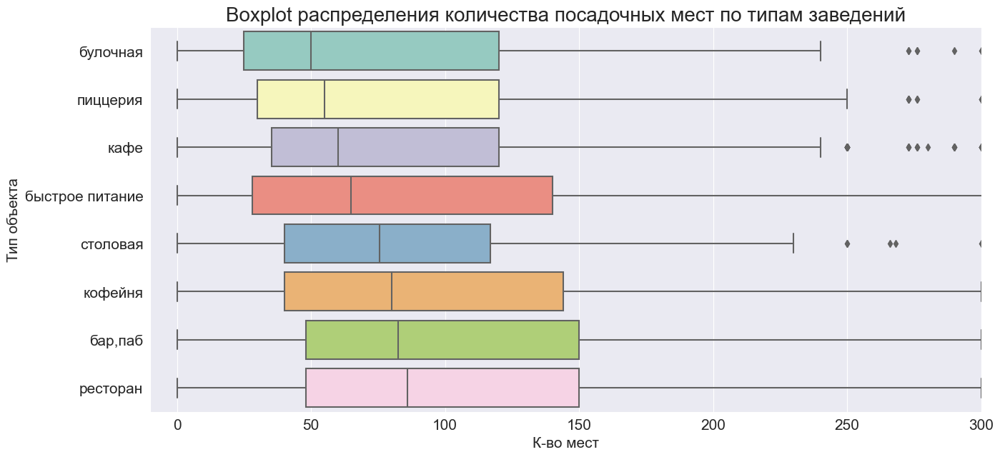

In [34]:
ax = sns.boxplot(x='seats', 
                 y='category', 
                 data=seats, 
                 palette="Set3",
                 order=order)    
    
rcParams['figure.figsize'] = 20, 20 
ax.set_xlim(-10,300)
plt.title('Boxplot распределения количества посадочных мест по типам заведений', 
          fontsize=20)
plt.xlabel('К-во мест', 
          fontsize=15)
plt.ylabel('Тип объекта', 
          fontsize=15)
ax.tick_params(labelsize=15)

Отметим, что выбросы встречаются довольно часто - что логично для разных заведений.

#### Выводы:
- Наибольшее число мест в ресторанах, барах и кофейнях - туда приходят не только поесть, но и провеси время. 
- Булочные, пиццерии и кафе - скорее про быстрые перекусы или еду "на вынос", что позволяет сократить число посадочных мест.
- В целом, распределение логичное и позволяет судить о хорошем качестве данных. 

3. Топ-15 сетей Москвы:

Уберем названия, которые не позволяют говорить об оригинальности авторов, а значит не позволяют с точностью объеденить заведения в сеть:

In [35]:
nonunique_name_list = ['кафе', 'ресторан', 'хинкальная', 'шаурма', 'чайхана', 'столовая']
top_chain = df[~df['name'].isin(nonunique_name_list)]
top_chain = top_chain['name'].value_counts().head(15).reset_index()
top_chain.columns = ['name', 'amount']
top_chain

,name,amount
0,шоколадница,120
1,домино'с пицца,77
2,додо пицца,74
3,one price coffee,72
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,кофепорт,42
8,кулинарная лавка братьев караваевых,39
9,теремок,38


Визуализируем:

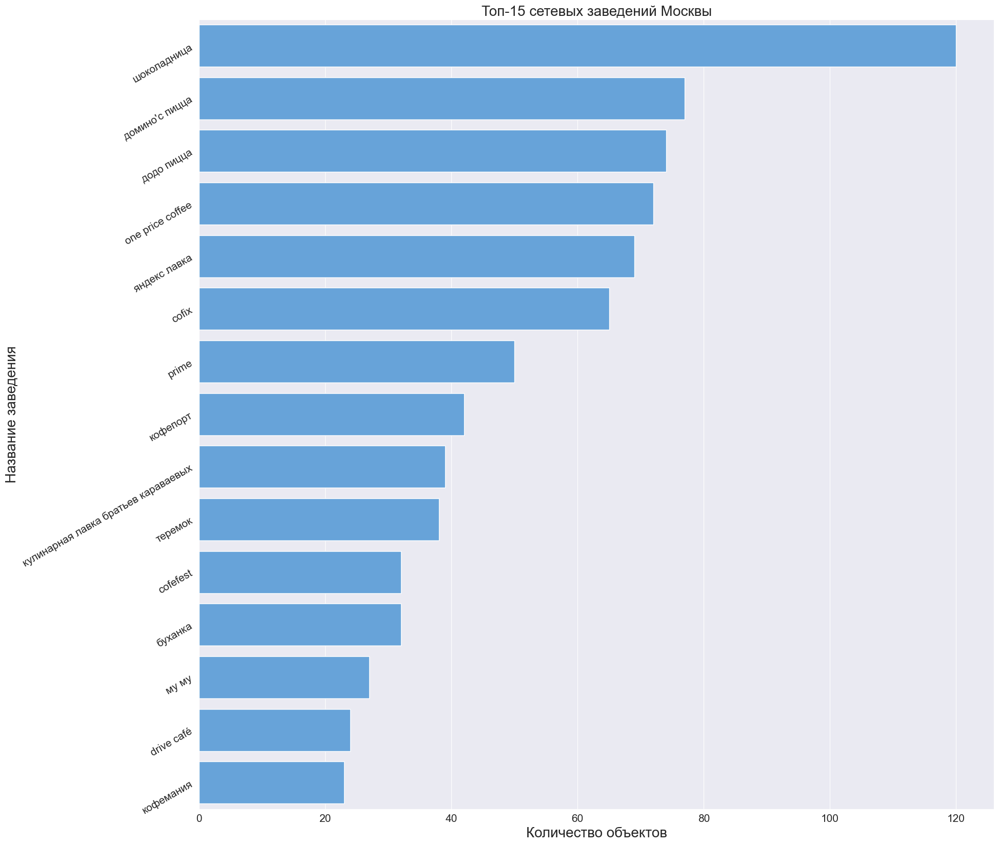

In [36]:
ax = sns.barplot(x='amount', 
                 y='name', 
                 data=top_chain,
                 color='#54a4ec')
               #  ,palette="Set1")

ax.set_title('Топ-15 cетевых заведений Москвы', 
          fontsize=20)
ax.set_xlabel('Количество объектов', 
          fontsize=20)
ax.set_ylabel('Название заведения', 
          fontsize=20)
plt.yticks(rotation=30)
ax.tick_params(labelsize=15)

Шоколадница и пиццерии лидируют в отсутсвии крупных сетей фастфуда. Построим pieplot:

In [37]:
#cформируем топ-15 и сделаем отдельный список
top_chain_name_list = top_chain['name'].unique()
top_chain = df[df['name'].isin(top_chain_name_list)]
top_chain.sort_values(by='name')
#выделим категории и посчитаем к-во заведений внутри категорий
top_сategory = top_chain['category'].value_counts().reset_index()
top_сategory.columns = ['category', 'amount']
top_сategory

,category,amount
0,кофейня,359
1,ресторан,163
2,пиццерия,152
3,кафе,79
4,булочная,25
5,быстрое питание,4
6,столовая,1
7,"бар,паб",1


In [38]:
px.bar(top_сategory, 
       x='category', 
       y='amount',
       title='Доля сетей в различных типах заведений',
       labels={'category':'Тип заведния', 'amount': 'Доля заведений'}, 
       height=600)

Большинство топовых сетей - кофейни, рестораны и пиццерии. 

#### Выводы:
- Бросается в глаза отсутсвие крупных сетей - макдональдса, кфс и бургер кинга. 
- Шоколадница, доминос и додо пиццы - широко распространены.
- Большнство топовых сетей представлены кофейнями, ресторанами и пиццериями, бары, пабы и столовые - более уникальные.

4. Распределение по административным районам Москвы

Создадим табличку с распределением по административным округам:

In [39]:
district = df['district'].value_counts().to_frame().reset_index()
district.columns = ['district', 'amount']
district

,district,amount
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


Для наглядности в схеме - изменим названия на аббревиатуры:

In [40]:
district.loc[(district['district'] == 'Центральный административный округ'), 'district'] = 'ЦАО'
district.loc[(district['district'] == 'Северный административный округ'), 'district'] = 'САО'
district.loc[(district['district'] == 'Южный административный округ'), 'district'] = 'ЮАО'
district.loc[(district['district'] == 'Северо-Восточный административный округ'), 'district'] = 'СВАО'
district.loc[(district['district'] == 'Западный административный округ'), 'district'] = 'ЗАО'
district.loc[(district['district'] == 'Восточный административный округ'), 'district'] = 'ВАО'
district.loc[(district['district'] == 'Юго-Восточный административный округ'), 'district'] = 'ЮВАО'
district.loc[(district['district'] == 'Юго-Западный административный округ'), 'district'] = 'ЮЗАО'
district.loc[(district['district'] == 'Северо-Западный административный округ'), 'district'] = 'СЗАО'

И построим график:

In [41]:
px.bar(district, 
       x='district', 
       y='amount',
       title='Доля объектов общественного питания по административным округам Москвы',
       labels={'district':'Округ', 'amount': 'Доля заведений'}, 
       height=600)

Посмотрим на типы объектов:

In [42]:
district_df = df.groupby(
    ['category', 'district'], as_index=False)['rating'].agg('count').sort_values(by='rating', ascending=False)

fig = px.bar(district_df, 
             x='district', 
             y="rating", 
             color="category")
fig.update_layout(title='Распределение объектов питания различных типов по административным округам', 
                  legend_title_text='Тип объекта', 
                  xaxis_title="Округ", 
                  yaxis_title="Число объектов")
#fig.update_yaxes(tickangle=-20)
fig.show()

#### Выводы:
- Логично, что большинство заведений - в центральном округе. 
- В остальных округах распределение относительно равномерное, но Северо-Западный округ явно проигрывает остальным округам. 
- Доли различных типов по округам распределены относительно равномерно.

5. Распределение среднего рейтинга заведений

Создадим таблицу со средним ретингом заведений по типам:

In [43]:
rating_df = df.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


Визуализируем:

In [44]:
fig = px.bar(rating_df, 
       x='category',
       y='rating', 
       height=600)

fig.update_layout(title='Средний рейтинг для разных типов заведений', 
                  xaxis_title="Тип заведения", 
                  yaxis_title="Средний рейтинг")

#### Выводы:
- Средний рейтинг распределен довольно равномерно.
- Бары и пабы, а также пиццерии и рестораны имеют среднии оценки чуть выше, а столовые, кафе и фастфуд - чуть ниже. 
- Средняя оценка не опускается ниже 4.


6. Распределение среднего рейтинга заведений по административным округам

Посмотрим, как меняется ретинг заведений по округам:

In [45]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Подготоим все для визуализации геолокации:

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

#### Выводы:
- Наивысшие оценки в центральном округе, очевидно, что качество заведений там, в среднем, выше. 
- Хуже всего дела в Северо-Восточном и Юго-Восточном округах - там самые низкие оценки заведений. Интересно, с чем это может быть связано.

7. Отображение всех заведений датасета на карте с помощью кластеров.

In [47]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# обновляем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Выводы:
- Данные сопадают с нашими графиками - в центральном округе больше всего заведений общественного питания. 
- В целом, чем ближе к центру, тем больше объектов питания мы встретим, что не удивительно. 

8. Топ-15 улиц по к-ву заведений

Создадим список топ-15 улиц по числу заведений:

In [48]:
#создадим таблицу без пропущенных значений:
top_streets = df[~df.street.isna()]

#найдем топ-15 улиц:
top_streets = top_streets['street'].value_counts().head(15).reset_index()
top_streets.columns = ['street', 'amount']
top_streets

,street,amount
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,75
8,ленинградское шоссе,69
9,мкад,65


Визуализируем:

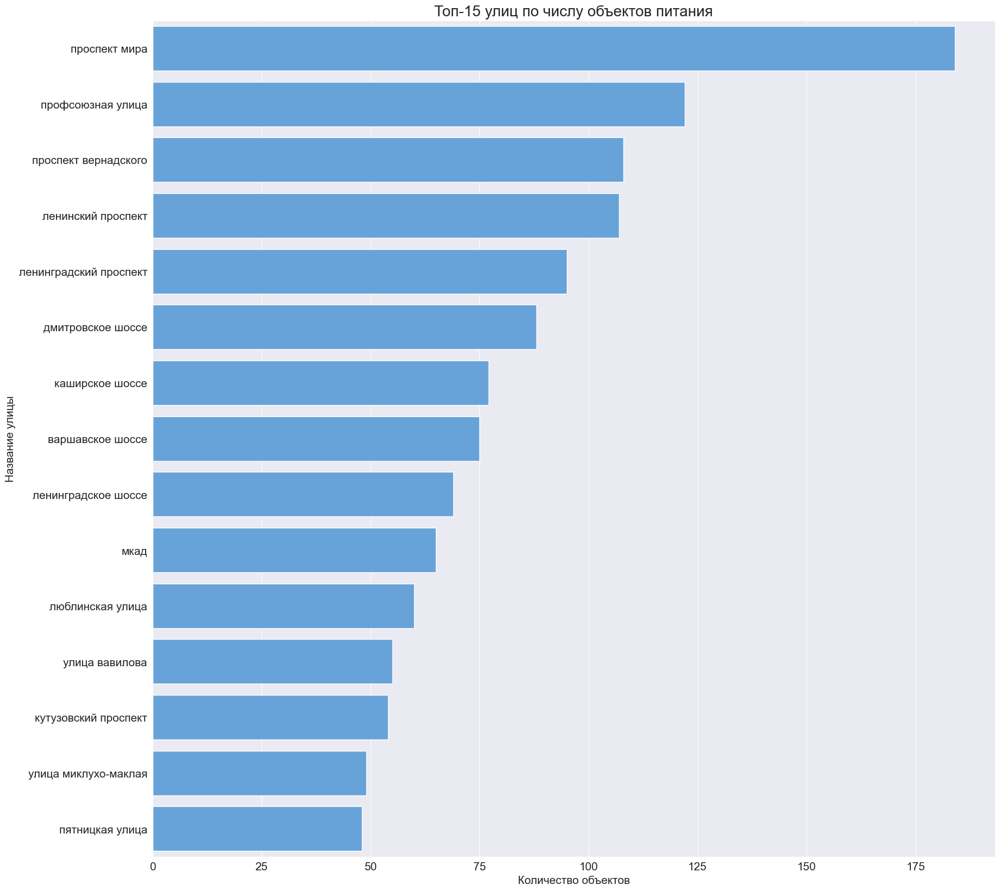

In [49]:
ax = sns.barplot(x='amount', 
                 y='street', 
                 data=top_streets, 
                 color='#54a4ec')

ax.set_title('Топ-15 улиц по числу объектов питания', 
          fontsize=20)
ax.set_xlabel('Количество объектов', 
          fontsize=15)
ax.set_ylabel('Название улицы', 
          fontsize=15)

ax.tick_params(labelsize=15)

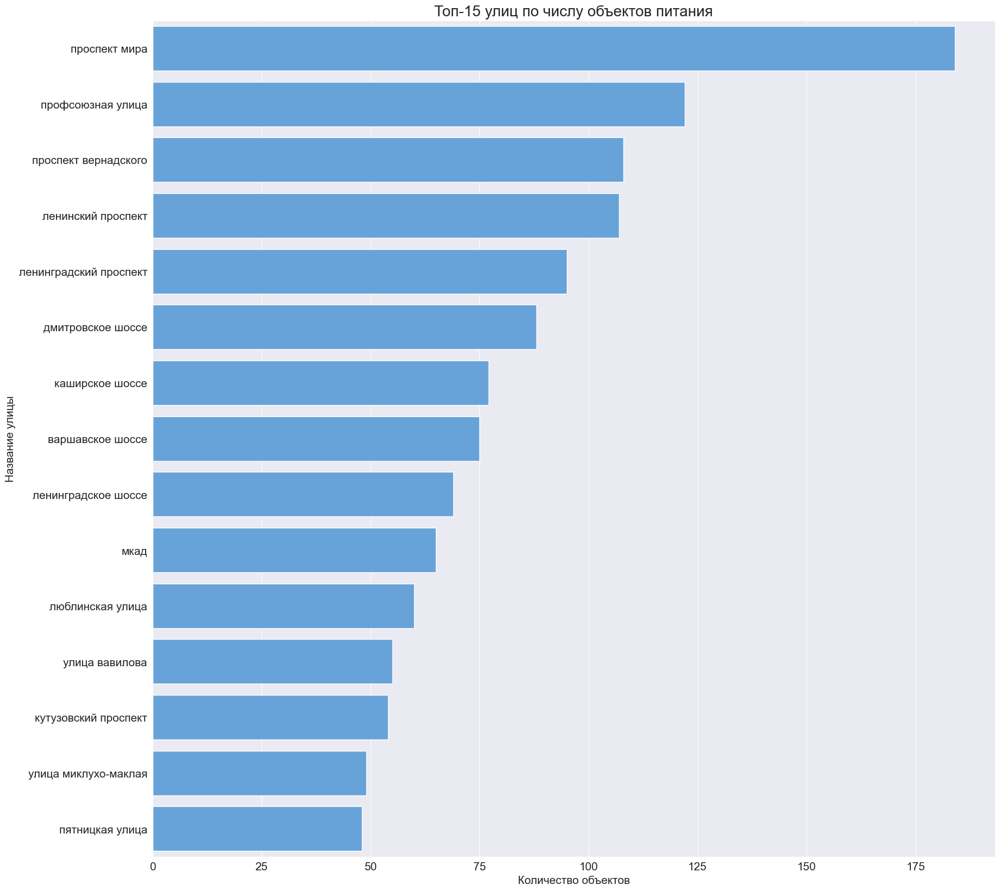

In [50]:
ax = sns.barplot(x='amount', 
                 y='street', 
                 data=top_streets, 
                 color='#54a4ec')

ax.set_title('Топ-15 улиц по числу объектов питания', 
          fontsize=20)
ax.set_xlabel('Количество объектов', 
          fontsize=15)
ax.set_ylabel('Название улицы', 
          fontsize=15)

ax.tick_params(labelsize=15)

В топе видим улицы - гиганты: проспекты, шоссе, МКАД - на которых, в результате огромной длинны улиц будет много объектов питания. Посмотрим, как распределяются тип заведений:

In [51]:
streets_df = df.groupby(
    ['category', 'street'], as_index=False)['rating'].agg('count').sort_values(by='rating', ascending=False)


top_street_list = top_streets['street'].unique()
streets_df = streets_df.query('street in @top_street_list')

fig = px.bar(streets_df, 
             x="street", 
             y="rating", 
             color="category")

fig.update_layout(title='Распределение объектов питания различных типов для топ-15 улиц', 
                  legend_title_text='Тип объекта', 
                  xaxis_title="Улица", 
                  yaxis_title="Число объектов")
fig.show()

#### Выводы:
- В топе улиц - крупные проспекты и шоссе.
- Распределение объектов питания на  них соответствет общегородскому, с учетом спицифики - так, на МКАДе малая доля ресторанов и много кафе и фастфуда, а на пятницкой улице и ленинградском проспекте доля кафе уменьшается, зато больше ресторанов, баров и кофеен. 

8. Улицы с одним объектом питания.

Попробуем найти улицы, где только один объект питания:

In [52]:
#найдем заведения с одним объектом
one_cafe = df['street'].value_counts().reset_index()
one_cafe.columns = ['street', 'amount']
one_cafe = one_cafe[one_cafe['amount'] == 1]
one_cafe_list = one_cafe['street'].unique()
one_cafe = df.query('street in @one_cafe_list')
one_cafe

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,несетевой,180.0,False,улица бусиновская горка
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевой,NaN,False,прибрежный проезд
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,сетевой,NaN,False,угличская улица
71,cofefest,кофейня,"москва, новгородская улица, 23а",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,сетевой,NaN,False,новгородская улица
97,жигулевское,"бар,паб","москва, бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,цена бокала пива:90–230 ₽,NaN,NaN,несетевой,NaN,False,бибиревская улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевой,NaN,False,улица артюхиной
8299,шашлычный рай,кафе,"москва, юго-восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.721304,37.733848,4.1,NaN,NaN,NaN,NaN,несетевой,NaN,False,квартал 90а грайвороново
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевой,NaN,False,кузьминская улица
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевой,40.0,False,новороссийская улица


Таких объектов 425. Посмотрим на карту:

In [53]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_cafe.apply(create_clusters, axis=1)

# выводим карту
m

In [54]:
one_cafe_category = top_chain['category'].value_counts().reset_index()
one_cafe_category.columns = ['category', 'amount']
one_cafe_category

fig = px.pie(one_cafe_category, 
             values='amount', 
             names='category',
             title='Типы заведений находящихся в одиночестве на улице')
#fig.update_traces(textposition='inside', textinfo='percent+label')
           
fig.show()

#### Выводы:
- Географически сложно найти закономерности в распределении таких заведений
- Таких заведений много в центре (неполные данные в датафрейме или маленькие улицы), встречаются и на окраинах.
- Большинство таких заведений - кофейни, рестораны и пиццерии - как и в целом по городу. 

9. Средний чек.

Проверим пропуски:

In [55]:
df['middle_avg_bill'].isna().sum()

5257

Создадим таблицу без пропусков:

In [56]:
avg_bill = df
avg_bill['middle_avg_bill'].dropna()
avg_bill = avg_bill.groupby('district')['middle_avg_bill'].agg('median')
avg_bill.sort_values(ascending=False)

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

Нарисуем:

In [57]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

#### Выводы:
- Данные согласуются с логикой:
 - Центр и Запад - самые дорогие округа.
 - СВАО, ЮАО и ЮВАО - самые дешевые (возможно тут есть связь с средним рейтингом заведений).
- Средний чек отличается примерно в два раза от самого дешевого к самому дорогому.
- Во Внуково - дорогие рестораны)

### Вывод по анализу данных:
- В Мокве преобладают кафе, рестораны и кофейни, тогда как булочные, столовые и фастфуд представленны меньше:
  - На долю кафе и ресторанов в сумме приходится более 50% заведений в Москве.
  - Фастфуд, булочные и столовые занимают в сумме около 15%.
  - Возможно, данные не полные или аномальные для этого года. 
- Большинство заведений Москвы - несетевые.
  - Доля сетевых порядка 40%.
  - Большая доля сетевых заведений среди булочных (порядка 60%), пиццерий(52%) и кофеен (около 51%).
  - Меньше всего у пабов, баров(22%) и столовых(28%).
- В среднем, число посадочных мест варьируется от 50 до 85, но бывают исключения с бОльшим числом мест.
  - Больше всего мест в среднем в ресторанах, барах и кофейнях, где люди хотят не только поесть, но и провести время.
  - Меньшее к-во в булочных пиццериях и кафе, где люди хотят быстро перекусить или взять еду с собой.
- Большинство крупных сетевых заведений предсавленно кофейнями (46%), фастфуд, столовые и бары не имеют больших сетей.
  - Самые большие сети - Шоколадница, Домино'с пицца, Додо пицца.
- В Центарльном округе наибольшее число заведений (26.7%), меньше всего в СЗАО (4.9%).
  - В остальных округах распределение примерно одинаковое - около 8-10% от всех.
  - Внутри округов типы заведений встречаются примерно с одинаковой частотой.
- Средний рейтинг зависит от типов заведений:
  - Самый высокий у баров/пабов (4.4%), самый низкий у фастфуда (4%).
- Средний ретинг зависит от округа:
  - Наивысшие оценки в ЦАО (4.4%).
  - Низшие оценки в СВАО и ЮВАО (в обоих 4.2%).
- По округам заведения питания распределены неравномерно - большая часть в центарльном округе, тогда как к окраине число снижается.
- Улицы, на которых больше всего заведений - крупные проспекты, шоссе и МКАДы. Доли различных типов заведений на них отличаются - на МКАДЕ много кафе, а на Ленинградском проспекте - ресторанов. 
- Средний чек выше в Центральном и Западном округах, а в СВАО, ЮВАО и ЮАО - почти в два раза ниже. 

#  [Открытие кофейни](#back)
<a id='сoffee'></a>


Создадим таблицу с коейнями:

In [58]:
coffee = df.query('category == "кофейня"')
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевой,NaN,False,улица маршала федоренко
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевой,NaN,False,NaN
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевой,46.0,False,коровинское шоссе
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевой,NaN,False,улица маршала федоренко
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевой,NaN,False,улица дыбенко
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевой,NaN,False,люблинская улица
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,цена чашки капучино:100–220 ₽,NaN,160.0,несетевой,206.0,False,волгоградский проспект
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевой,NaN,False,грайвороновская улица
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,цена чашки капучино:80–120 ₽,NaN,100.0,несетевой,NaN,False,новохохловская улица


Попробуем построить распределение кофеен по округам:

In [59]:
district = coffee['district'].value_counts().to_frame().reset_index()
district.columns = ['district', 'amount']

district.loc[(district['district'] == 'Центральный административный округ'), 'district'] = 'ЦАО'
district.loc[(district['district'] == 'Северный административный округ'), 'district'] = 'САО'
district.loc[(district['district'] == 'Южный административный округ'), 'district'] = 'ЮАО'
district.loc[(district['district'] == 'Северо-Восточный административный округ'), 'district'] = 'СВАО'
district.loc[(district['district'] == 'Западный административный округ'), 'district'] = 'ЗАО'
district.loc[(district['district'] == 'Восточный административный округ'), 'district'] = 'ВАО'
district.loc[(district['district'] == 'Юго-Восточный административный округ'), 'district'] = 'ЮВАО'
district.loc[(district['district'] == 'Юго-Западный административный округ'), 'district'] = 'ЮЗАО'
district.loc[(district['district'] == 'Северо-Западный административный округ'), 'district'] = 'СЗАО'

fig = px.pie(district, 
             values='amount', 
             names='district',
             title='Доля кофеен по административным округам Москвы')
fig.update_traces(textposition='inside', textinfo='percent+label')
           
fig.show()

В целом распределение кофеен, как и всех остальных заведений. Оценим число ежедневно-круглосуточных кофеен:

In [60]:
coffee_24 = coffee[coffee['is_24/7'] == True]
coffee_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,сетевой,20.0,True,дмитровское шоссе
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,сетевой,25.0,True,ярославское шоссе
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,цена чашки капучино:140–200 ₽,NaN,170.0,сетевой,NaN,True,ярославское шоссе
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,сетевой,NaN,True,мкад
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,средний счёт:650–850 ₽,750.0,NaN,сетевой,200.0,True,улица народного ополчения
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,цена чашки капучино:235–335 ₽,NaN,285.0,сетевой,NaN,True,ленинградский проспект
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,сетевой,15.0,True,ленинградский проспект
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,сетевой,NaN,True,улица золоторожский вал
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,средний счёт:2000 ₽,2000.0,NaN,сетевой,140.0,True,лесная улица
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,сетевой,230.0,True,долгоруковская улица


Таких кофеен не много

Построим распределение по рейтингу в разных округах:

In [61]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    legend_name='Рейтинг кофеен по округам',
).add_to(m)

# выводим карту
m

Cамые высокие оценки в СВАО(неожиданно) и ВАО. А самые низки в САО, ЮАО и ЗАО.
Посмотрим на расположение кофеен c разграничением по округам и рейтингу:

In [62]:
# создаём карту Москвы
#m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

Посмотрим на среднюю цену чашки кофе по округам:

In [63]:
сoffee_bill = coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending=False)

fig = px.bar(сoffee_bill, 
       x='district',
       y='middle_coffee_cup', 
       height=600)
fig.update_layout(title='Средняя цена чашки кофе по округам', 
                  xaxis_title="Округ", 
                  yaxis_title="Цена")

Цена чашки кофе в Юго-Западном и Центральном округах на 50-60 рублей больше, чем в Восточном и Юго-Восточном

### Выводы и рекомендации
(пока смотрю сериал, чтобы понять, о какой кофейне речь):

Исходя из стилистики кафе можно предложить несколько вариантов:

- Максимально аутентичное кафе с соответсвующей рекламой:
  - Возможно стоит открывать в Центральном округе, ближе к центру или к курпным улицам.
  - Стоимость чашки кофе будет высокой (около 190 рублей).
  - Доля кофеен в этом округе большая, но рейтинг не очень высокий и большая доступность, а значит много посетителей. 
  
- Кафе "в духе" сериала:
  - Открывать можно в Западном округе.
  - Конкуренция низкая - средний рейтинг кофеен не высокий - есть шанс понравится публике.
  - Возможно получить "свою" аудиторию, которую привлечет антураж, и которой хватит места, в отличии от Центрального округа, где большая текучка и возможно меньшее число постоянных клиентов (этот пункт надо проверить по данным посещений аналогичных кофеен)
  - Стоимость чашки кофе будет высокой (около 190 рублей).
  - Меньшая доля кофеен, опять же - ниже конкуренция.
  - Средний чек в целом высокий - публика имеет достаточно средств.
  - Район МГУ или более центральный - привлечет клиентов. 